# WEB SCRAPING ASSIGNMENT 3


In [1]:
#importing the required library

import pandas as pd
import numpy as np
import time
import urllib
import os
import selenium
import csv
import warnings
warnings.filterwarnings("ignore")
from selenium import webdriver
from selenium.webdriver.common.by import By
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver import ActionChains
from selenium.common.exceptions import NoSuchElementException

# importing regex
import re


In [7]:
# Q1: Input for scraping from amazon
inp = input("Enter the keyword to search: ")
print("\n Amazon is searched for :",inp)

#Q2 Scraping data from amazon
driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()))
#driver=webdriver.Chrome('chromedriver.exe')
url='https://www.amazon.in'
driver.get(url)
driver.maximize_window()
#driver.implicitly_wait(10)
driver.find_element(By.XPATH,'//div[@class="nav-search-field "]/input').send_keys(inp) #providing search input
time.sleep(1)
driver.find_element(By.XPATH,'//input[@value="Go"]').click()
time.sleep(4)

product_urls=[]
start=0
end=3

for page in range(start,end):
    url=driver.find_elements(By.XPATH,"//a[@class='a-link-normal s-underline-text s-underline-link-text s-link-style a-text-normal']")
    for i in url:
        product_urls.append(i.get_attribute("href"))
    driver.find_element(By.LINK_TEXT,"Next").click()
    time.sleep(3)

brand_name=[]
prod_name=[]
prod_price=[]
exchange=[]
exp_delivery=[]
availability=[]
prod_url=[]
    
for url in product_urls:
    driver.get(url)
    time.sleep(1)
    
    try:
        name= driver.find_element(By.ID,"productTitle")
        #brand= driver.find_element(By.ID,"productTitle").split()[0]
        price= driver.find_element(By.XPATH,"//span[@class='a-price a-text-price a-size-medium apexPriceToPay']")
        exch=driver.find_element(By.XPATH,"//a[@class='a-size-small a-link-normal a-text-normal'][contains(text(),'Replacement')]")
        exp_del=driver.find_element(By.ID,"mir-layout-DELIVERY_BLOCK-slot-PRIMARY_DELIVERY_MESSAGE_LARGE")
        avail=driver.find_element(By.XPATH,"//span[@class='a-size-medium a-color-success']")
        prod_url.append(url)
        brand_name.append(name.text.split()[0])
        prod_name.append(name.text)
        prod_price.append(price.text)
        exchange.append(exch.text)
        exp_delivery.append(exp_del.text)
        availability.append(avail.text)
    except (NoSuchElementException,NameError) :
        brand_name.append('-')
        prod_name.append('-')
        exchange.append('-')
        exp_delivery.append('-')
        availability.append('-')
        prod_price.append('-')
        prod_url.append('-')
    
    
        

amazon_df=pd.DataFrame({'Brand Name':brand_name,'Product Name':prod_name,'Refund Policy':exchange,'Expected Deliver':exp_delivery,
                      'Availability':availability,'Product Price':prod_price,'URL':prod_url})

amazon_df

Enter the keyword to search: guitar

 Amazon is searched for : guitar



,Brand Name,Product Name,Refund Policy,Expected Deliver,Availability,Product Price,URL
0,Kadence,Kadence Frontier guitar with Online Guitar lea...,7 Days Replacement,"FREE delivery Fri, 7 Oct. Details",,"₹3,999.00",https://www.amazon.in/sspa/click?ie=UTF8&spc=M...
1,Kadence,Kadence Slowhand Premium Jumbo Semi Acoustic G...,7 Days Replacement,"FREE delivery Sun, 9 Oct. Details",Only 1 left in stock.,"₹8,999.00",https://www.amazon.in/sspa/click?ie=UTF8&spc=M...
2,-,-,-,-,-,-,-
3,-,-,-,-,-,-,-
4,Juârez,"Juârez Acoustic Guitar, 38 Inch Cutaway, 038C ...",7 Days Replacement,"FREE delivery Fri, 7 Oct. Details",In stock.,"₹1,990.00",https://www.amazon.in/Juarez-Acoustic-Cutaway-...
...,...,...,...,...,...,...,...
178,-,-,-,-,-,-,-
179,-,-,-,-,-,-,-
180,-,-,-,-,-,-,-
181,-,-,-,-,-,-,-


In [6]:
#  Question 3 Write a python program to access the search bar and search button on images.google.com and
#scrape 100 images each for keywords ‘fruits’, ‘cars’ and ‘Machine Learning’.

def get_url(search_term): #Creating Function for generating URL with search term in images.google.com
    """Generate a URL for search Term"""
    template = 'https://www.google.com/search?q={}&source=lnms&tbm=isch&sa=X&ved=2ahUKEwip5oaS7YXwAhUFjeYKHQ71BwsQ_AUoAXoECAIQAw&biw=1536&bih=710&dpr=1.25'
    search_term = search_term.replace(' ','+')
    return template.format(search_term)

def search_image(search_term): #Creating function for scraping images.
    """Search images for given search term and saved in Directory"""

    driver = webdriver.Chrome()
    url = get_url(search_term)
    driver.get(url)
    driver.maximize_window()
    
    try: #Creating Directory.
        if not os.path.exists(search_term):
            os.makedirs(search_term)
    except OSError:
        print ('Error: Creating directory. ' +  search_term)
        
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    
    time.sleep(1)     
    img_source = []
        
    while True: #Loop for searching 100 images.
        for i in driver.find_elements_by_xpath('//div[@class="bRMDJf islir"]/img'):
            img_source.append(i.get_attribute('src'))
            driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
            time.sleep(2)
            IMG = [J for J in img_source if J] 
        if len(IMG) == 100:
            break
      
    for j in range(0,len(IMG)): #Saving the images
        exec(f"urllib.request.urlretrieve(img_source[j], './{search_term}/{search_term}_{j}.jpg')")
    driver.close()
    
    plt.figure(figsize =(20,70)) #Displaying the saved images
    for i in range(0,len(img_source)):
        file = os.listdir(f"{search_term}")[i]
        image_path = os.path.join(f"{search_term}",file)
        img = mpimg.imread(image_path)
        ax = plt.subplot(20,5,i+1)
        ax.title.set_text(file)
        image = plt.imshow(img)
    
    return print(f"{len(IMG)} Images of {search_term} saved at ",os.path.abspath(f"{search_term}"),"\n",image)

100 Images of fruits saved at  C:\Users\Friday\fruits 
 AxesImage(1103.59,630;192.414x159.882)


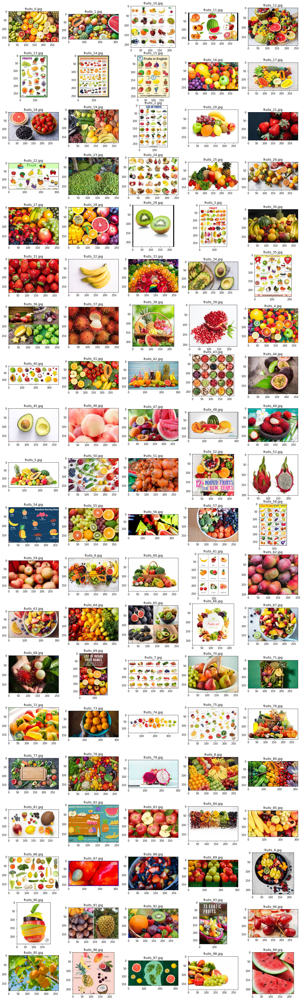

In [7]:
search_image('fruits')

100 Images of car saved at  C:\Users\Friday\car 
 AxesImage(1103.59,630;192.414x159.882)


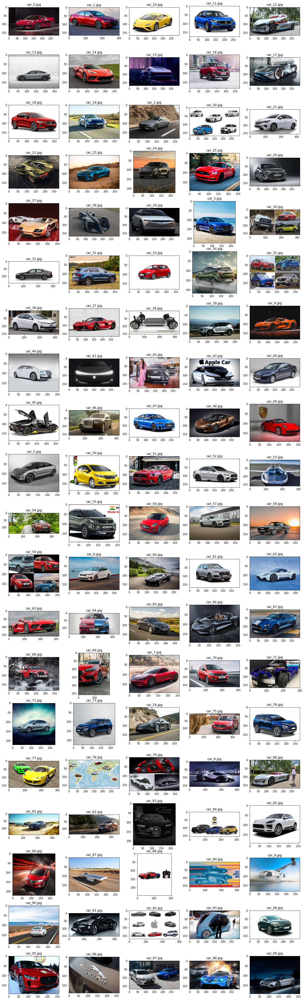

In [8]:
search_image('car')

100 Images of Meachine Learning saved at  C:\Users\Friday\Meachine Learning 
 AxesImage(1103.59,630;192.414x159.882)


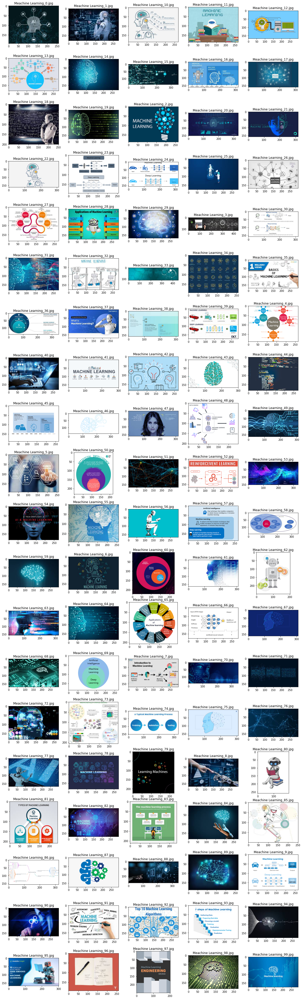

In [9]:
search_image('Meachine Learning')

In [10]:
# Q4: Write a python program to search for a smartphone on www.flipkart.com 

def flipkart(search_term):
    """Generate a URL for search Term"""
    template = 'https://www.flipkart.com/search?q={}&otracker=search&otracker1=search&marketplace=FLIPKART&as-show=on&as=off'
    search_term = search_term.replace(' ','%20')
    return template.format(search_term)

def search_mobile(search_term):
    """Function helps to search first page from Flipkart.com"""
    
    Product_URL = []
    Brand_Name = []
    Smartphone_name = []
    Price = []
    color = []
    Display_Size = []
    Display_Resolution = []
    Processor = []
    Processor_Cores = [] 
    Internal_Storage = []
    RAM = []
    Primary_Camera = []
    Secondary_Camera = []
    Battery_Capacity = []
      
    
    driver = webdriver.Chrome()
    url = flipkart(search_term)
    driver.get(url)
    driver.maximize_window()
    
    #Scraping URL from the searched term
    for i in driver.find_elements_by_xpath("//div[@class='_2kHMtA']/a[@class = '_1fQZEK']"):
        Product_URL.append(i.get_attribute('href'))
        
    driver.close()
    
    
    for i in Product_URL:
        driver = webdriver.Chrome()
        driver.get(i)
        driver.maximize_window()
        
        #Scraping Smartphone_name from the searched term
        Smartphone_name.append(driver.find_element_by_xpath("//h1[@class = 'yhB1nd']/span[@class = 'B_NuCI']").text)
        
        #Scraping Price from the searched term
        Price.append(driver.find_element_by_xpath("//div[@class = '_25b18c']/div[@class = '_30jeq3 _16Jk6d']").text)
    
        btn = driver.find_element_by_xpath("//button[@class = '_2KpZ6l _1FH0tX']")
        btn.click()
        time.sleep(2)
        
        dummy = [] #creating two dummy list to store all the details of the Product
        for i in driver.find_elements_by_xpath("//div/div[@class = '_1UhVsV']"):
            dummy.append(i.text)
        
        driver.close()
        
        Dummy = [i.split('\n') for i in dummy]
        Dummy= Dummy[0]
        Dummy.remove('General')
        
        #spliting the required details from Dummy
        for i in range(0,len(Dummy)):
            if Dummy[i] == 'Color':
                color.append(Dummy[i+1])    
            if Dummy[i] == 'Display Size':
                Display_Size.append(Dummy[i+1])    
            if Dummy[i] == 'Resolution':
                Display_Resolution.append(Dummy[i+1])    
            if Dummy[i] == 'Processor Type':
                Processor.append(Dummy[i+1])      
            if Dummy[i] == 'Processor Core':
                Processor_Cores.append(Dummy[i+1])   
            if Dummy[i] == 'Internal Storage':
                Internal_Storage.append(Dummy[i+1])
            if Dummy[i] == 'RAM':
                RAM.append(Dummy[i+1])
            if Dummy[i] == 'Primary Camera':
                if Dummy[i+1] != 'Call Features':
                    Primary_Camera.append(Dummy[i+1])
            if Dummy[i] == 'Secondary Camera':
                Secondary_Camera.append(Dummy[i+1])
            if Dummy[i] == 'Battery Capacity':
                Battery_Capacity.append(Dummy[i+1])
        
    
    Brand_Name = [i.split(' ')[0] for i in Smartphone_name] #Spliting Brand details from smart Smartphone_name
    
    #Creating DataFrame.
    Iteams = pd.DataFrame({"Brand_Name" :Brand_Name,
                           "Smartphone_name" :Smartphone_name,
                           "Price" :Price,
                           "Color" :color,
                           "Display_Size" :Display_Size,
                           "Display_Resolution" :Display_Resolution,
                           "Processor" :Processor,
                           "Processor_Cores" :Processor_Cores, 
                           "Internal_Storage" :Internal_Storage,
                           "RAM" :RAM,
                           "Primary_Camera" :Primary_Camera,
                           "Secondary_Camera" :Secondary_Camera,
                           "Battery_Capacity" :Battery_Capacity,
                           "Product_URL":Product_URL,})
    
    #saving the dataframe in csv
    Iteams.to_csv(f"{'FlipKart searched '+search_term}.csv",index=False)
    
    return Iteams    
     

In [11]:
search_mobile("Samsung smart phones")

,Brand_Name,Smartphone_name,Price,Color,Display_Size,Display_Resolution,Processor,Processor_Cores,Internal_Storage,RAM,Primary_Camera,Secondary_Camera,Battery_Capacity,Product_URL
0,SAMSUNG,"SAMSUNG Galaxy F12 (Sky Blue, 64 GB) (4 GB RAM)","₹10,999",Sky Blue,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,64 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-sk...
1,SAMSUNG,"SAMSUNG Galaxy F12 (Sea Green, 64 GB) (4 GB RAM)","₹10,999",Sea Green,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,64 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-se...
2,SAMSUNG,"SAMSUNG Galaxy F12 (Celestial Black, 64 GB) (...","₹10,999",Celestial Black,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,64 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-ce...
3,SAMSUNG,"SAMSUNG Galaxy F12 (Celestial Black, 128 GB) ...","₹11,999",Celestial Black,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,128 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-ce...
4,SAMSUNG,"SAMSUNG Galaxy F12 (Sea Green, 128 GB) (4 GB ...","₹11,999",Sea Green,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,128 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-se...
5,SAMSUNG,"SAMSUNG Galaxy F12 (Sky Blue, 128 GB) (4 GB RAM)","₹11,999",Sky Blue,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,128 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-sk...
6,SAMSUNG,"SAMSUNG Galaxy F41 (Fusion Blue, 64 GB) (6 GB...","₹14,999",Fusion Blue,16.26 cm (6.4 inch),2340 x 1080 Pixels,Exynos 9611,Octa Core,64 GB,6 GB,64MP + 8MP + 5MP,32MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f41-fu...
7,SAMSUNG,"SAMSUNG Galaxy F41 (Fusion Black, 128 GB) (6 ...","₹16,499",Fusion Black,16.26 cm (6.4 inch),2340 x 1080 Pixels,Exynos 9611,Octa Core,128 GB,6 GB,64MP + 8MP + 5MP,32MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f41-fu...
8,SAMSUNG,"SAMSUNG Galaxy F41 (Fusion Blue, 128 GB) (6 G...","₹16,499",Fusion Blue,16.26 cm (6.4 inch),2340 x 1080 Pixels,Exynos 9611,Octa Core,128 GB,6 GB,64MP + 8MP + 5MP,32MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f41-fu...
9,SAMSUNG,"SAMSUNG Galaxy F02s (Diamond Black, 64 GB) (4...","₹9,999",Diamond Black,16.55 cm (6.515 inch),1600 x 720 Pixels,Qualcomm Snapdragon 450 (SDM450-F01),Octa Core,64 GB,4 GB,13MP + 2MP + 2MP,5MP Front Camera,5000 mAh,https://www.flipkart.com/samsung-galaxy-f02s-d...


In [12]:
pd.read_csv('FlipKart searched Samsung smart phones.csv').head()

,Brand_Name,Smartphone_name,Price,Color,Display_Size,Display_Resolution,Processor,Processor_Cores,Internal_Storage,RAM,Primary_Camera,Secondary_Camera,Battery_Capacity,Product_URL
0,SAMSUNG,"SAMSUNG Galaxy F12 (Sky Blue, 64 GB) (4 GB RAM)","₹10,999",Sky Blue,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,64 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-sk...
1,SAMSUNG,"SAMSUNG Galaxy F12 (Sea Green, 64 GB) (4 GB RAM)","₹10,999",Sea Green,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,64 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-se...
2,SAMSUNG,"SAMSUNG Galaxy F12 (Celestial Black, 64 GB) (...","₹10,999",Celestial Black,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,64 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-ce...
3,SAMSUNG,"SAMSUNG Galaxy F12 (Celestial Black, 128 GB) ...","₹11,999",Celestial Black,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,128 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-ce...
4,SAMSUNG,"SAMSUNG Galaxy F12 (Sea Green, 128 GB) (4 GB ...","₹11,999",Sea Green,16.55 cm (6.515 inch),1600 x 720 Pixels,Exynos 850,Octa Core,128 GB,4 GB,48MP + 5MP + 2MP + 2MP,8MP Front Camera,6000 mAh,https://www.flipkart.com/samsung-galaxy-f12-se...


In [13]:
# Q5 Write a program to scrap geospatial coordinates (latitude, longitude) of a city searched on google maps.

def GoogleMaps(search_city):
    """Generate a URL for search Term"""
    template = 'https://www.google.com/maps/place/{}/'
    search_city = search_city.replace(' ','+')
    return template.format(search_city)

def search_coordinates(search_city): #Creating Function for searching the location and returns the coordinates.
    driver = webdriver.Chrome()
    url = GoogleMaps(search_city)
    driver.get(url)
    driver.maximize_window()
    button = driver.find_element_by_xpath("//button[@aria-label = 'Search']")
    button.click()
    time.sleep(5)

    coordinates = [driver.current_url]
    driver.close()
    coordinates = [i.split('@')[1] for i in coordinates]
    coordinates = [i.split(',')[:2] for i in coordinates]
    coordinates = coordinates[0]
    
    return print(f"The geospatial coordinates of {search_city} \n Lattitude:", coordinates[0], "\n Longitude:", coordinates[1])


In [15]:
search_coordinates("Chennai")

The geospatial coordinates of Chennai 
 Lattitude: 13.0473748 
 Longitude: 79.9288101


In [16]:
search_coordinates("Moscow Russia")

The geospatial coordinates of Moscow Russia 
 Lattitude: 55.580748 
 Longitude: 36.8251156


In [19]:
search_coordinates("Flip Robo Banglore")

The geospatial coordinates of Flip Robo Banglore 
 Lattitude: 12.9779987 
 Longitude: 77.6374416


In [11]:
# 6. Write a program to scrap details of all the funding deals for second quarter (i.e Jan 21 – March 21) from trak.in
driver = webdriver.Chrome(service=Service(ChromeDriverManager().install())) 
# get webpage
driver.get("https://trak.in/")
driver.maximize_window()
time.sleep(2)

#click on funding deals and go to that page
fun_btn=driver.find_element(By.XPATH,"//li[@id='menu-item-51510']/a").get_attribute('href')
driver.get(fun_btn)

# Creating empty list
funding={}
funding["Date"]=[]
funding["Startup Name"]=[]
funding["Industry or Vertical"]=[]
funding["Sub Vertical"]=[]
funding["Location"]=[]
funding["Investor"]=[]
funding["Investment Type"]=[]
funding["Amount"]=[]

for i in range(54,57):


    # Scraping data of Date
    date_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[2]'.format(i))# {} and .format () used
    #so the number coming in function format(n) will replace {}
    for date in date_tags:
        funding['Date'].append(date.text)

    # Scraping data of Startup Name
    name_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[3]'.format(i))
    for name in name_tags:
        funding['Startup Name'].append(name.text)
    
    # Scraping data of Industry OR Vertical
    ind_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[4]'.format(i))
    for n in ind_tags:
        funding['Industry or Vertical'].append(n.text)
    
    # Scraping data of Sub-Vertical
    sv_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[5]'.format(i))
    for sv in sv_tags:
        funding['Sub Vertical'].append(sv.text)

    # Scraping data of Location
    loc_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[6]'.format(i))
    for loc in loc_tags:
        funding['Location'].append(loc.text)
    
    # Scraping data of Investor
    inv_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[7]'.format(i))
    for inv in inv_tags:
        funding['Investor'].append(inv.text)
        
    # Scraping data of Investment Type
    invt_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[8]'.format(i))
    for invt in invt_tags:
        funding['Investment Type'].append(invt.text)
    # Scraping data of Amount
    amt_tags = driver.find_elements(By.XPATH,'//table[@id="tablepress-{}"]/tbody/tr/td[9]'.format(i))
    for amt in amt_tags:
        funding['Amount'].append(amt.text)
        
details=pd.DataFrame(funding)
details

,Date,Startup Name,Industry or Vertical,Sub Vertical,Location,Investor,Investment Type,Amount
0,15/01/2021,Digit Insurance,Financial Services,Insurance Services,Bengaluru,"A91 Partners, Faering Capital, TVS Capital Funds",Venture,"1,80,00,000"
1,28/01/2021,Bombay Shaving Company,Consumer Goods Company,"Shave care, beard care, and skincare products",New Delhi,Reckitt Benckiser,Venture,"6,172,258.50"
2,19/01/2021,DeHaat,AgriTech Startup,online marketplace for farm products and services,Patna,Prosus Ventures,Series C,"30,000,000"
3,19/01/2021,Darwinbox,SaaS,HR Tech,Mumbai,Salesforce Ventures,Seed,"15,000,000"
4,18/01/2021,mfine,Health Tech Startup,AI-powered telemedicine mobile app,Bengaluru,Heritas Capital Management,Venture Round,"16,000,000"
5,18/01/2021,Udayy,EdTech,Online learning platform for kids in class 1-5,Gurgaon,Sequoia Capital,Seed Funding,"15,000,000"
6,11/01/2021,True Elements,Food Startup,Whole Food plant based Nashta,Pune,SIDBI Venture Capital,Series,"100,000,000"
7,13/01/2021,Saveo,B2B E-commerce,Pharmacies,Bengaluru,"Matrix Partners India, RTP Global, others",Seed,"4,000,000"
8,11/02/2021,Doubtnut,Edu Tech,E-Learning Platform,Gurgaon,"SIG Global, Sequoia Capital, WaterBridge Ventu...",Series B,"2,500,000"
9,22/02/2021,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,"Tiger Global, Kora",Venture,"250,000,000"


In [22]:
#7. Write a program to scrap all the available details of top 10 gaming laptops from digit.in. 

def digitin(gaming_laptop):
    """Creating function that searches the top 10 laptop and display it as DataFrame"""
    gaming_laptop = gaming_laptop.replace(' ','+')
    template = f'https://www.digit.in/search?keyword={gaming_laptop}&keywordby=toptens'
    
    driver = webdriver.Chrome()
    driver.get(template)
    driver.maximize_window()
    
    for i in driver.find_elements_by_xpath("//div[@class = 'searchPage']//a"):
        if i.text == 'Best Gaming Laptops in India': #Search and Clicks the required details       
            i.click()
            break
            
    index = [] # scraping the product seller and price details from Table
    for i in driver.find_elements_by_xpath("//table[@id = 'summtable']//td"):
        index.append(i.text)
        
    title = []
    merchant = []
    price = []
    OS = []
    Display = [] 
    Processor = []
    Memory = []
    Weight = []
    Dimension = []
    Graphics = []

    z= 0
    while z < len(index): # Splitting the collected table details
        title.append(index[z])
        z+=1
        merchant.append(index[z])
        z+=1
        price.append(index[z])
        z+=1
        
    #Creating the Dummy list and scraping required details from the Table     
    dummy = [i.text for i in driver.find_elements_by_xpath("//div[@class = 'Spcs-details']//tr")]
    driver.close()
    dummy= [i.split(" : ") for i in dummy]
    Dummy = [j for i in dummy for j in i]
    
    
    for i in range(0,len(Dummy)): #splitting the Dummy into different lists.
        if Dummy[i] == 'OS':
            OS.append(Dummy[i+1])
        if Dummy[i] == 'Display':
            Display.append(Dummy[i+1])
        if Dummy[i] == 'Processor':
            Processor.append(Dummy[i+1])        
        if Dummy[i] == 'Memory':
            Memory.append(Dummy[i+1])
        if Dummy[i] == 'Weight':
            Weight.append(Dummy[i+1])
        if Dummy[i] == 'Dimension':
            Dimension.append(Dummy[i+1])
        if Dummy[i] == 'Graphics Processor':
            Graphics.append(Dummy[i+1]) 
            
    #Creating DataFrame from the collected details.        
    Best_GamingLaptops_in_India = pd.DataFrame({"Title" : title,
                                                "OS" : OS,
                                                "Display" : Display, 
                                                "Processor" : Processor,
                                                "Memory" : Memory,
                                                "Weight" : Weight,
                                                "Dimension" : Dimension,
                                                "Graphics" : Graphics,
                                                "Can_Buy_From" : merchant,
                                                "Price" : price})
    
    return Best_GamingLaptops_in_India
    

In [23]:
laptop = digitin('gaming laptop')
laptop

,Title,OS,Display,Processor,Memory,Weight,Dimension,Graphics,Can_Buy_From,Price
0,MSI GT76 TITAN DT 9SG,Windows 10 Pro,"17.3"" (UHD 3840x2160)",Intel 9th Gen Core i9-9900K | 5000 MHz,1 TB HDD/64 GBGB DDR4,4.2 kg,397 x 330 x 33~42 mm,NVIDIA GeForce RTX 2080,N/A,₹379990
1,Alienware 17 Area-51m,Windows 10 Pro,"17.3"" (FHD (1920 x 1080))",Intel 9th Gen Core i9-9900K | 5000 MHz,1 TB PCIe SSD/32GB DDR4,3.87 Kg,42 mm x 402.6 mm x 319.14 mm,NVIDIA GeForce RTX 2080,amazon,₹422000
2,HP Omen 15 2020,Windows 10 Home,"15.6"" (1920 x 1080)",Intel i7-10750H 10th Gen | 1.6GHz,512 GB SSD/16 GBGB DDR4,5.40,14.09 x 9.44 x 0.89,Nvidia GeForce GTX 1650Ti,Tatacliq,₹117790
3,Asus Zephyrus G14,Windows 10 Home,"14"" (1920 x 1080)",AMD 3rd Generation Ryzen 9 | 3.3 GHz,1 TB SSD/16 GBGB DDR4,1.65,32.5 x 22.1 x 1.8,NVIDIA GeForce RTX 2060,amazon,₹164990
4,Lenovo Legion Y540,Windows 10 Home,"15.6"" (1920 X 1080)",9th Generation Core Intel I7-9750H | 2.6 Ghz,1 TB SSD/8GB DDR4,2.3,365mm x 260mm x 25.9mm,NVIDIA® GeForce RTX™ 2060,flipkart,₹79990
5,Asus ROG Zephyrus G GA502,Windows 10 Home,"15.6"" (1920 x 1080)",AMD Ryzen 7 Quad Core 3750H | 2.3 GHz,512 GB SSD/16GB DDR4,2.2,360 x 252 x 20.4,NVIDIA Geforce GTX 1660 Ti,flipkart,₹79990
6,Asus ROG Zephyrus S GX531,Windows 10 Home,"15.6"" (1920 X 1080)",9th Gen Intel Core i7-8750H | 2.2 GHz,512GB SSD/16 GBGB DDR4,2.1,360 (W) x 268 (D) x 15.35~16.15 (H) mm,NVIDIA® GeForce RTX™ 2070 (Max-Q),flipkart,₹239990
7,MSI GT83VR 7RE Titan SLI,Windows 10 Home 64 bit,"18.4"" (1920 x 1080)",Intel CM238 Core i7-7820HK+CM238 7th Gen | 3.5GHz,1.5 TB SATA/64GB DDR4,5.5,458 x 339 x 69,Dual GTX1070,N/A,₹349990
8,ASUS ROG ZEPHYRUS DUO 15,Windows 10,"15.6"" (3840 x 1100)",Intel Core i7 10th Gen 10875H | NA,512 GB SSD/4 GBGB DDR4,2.4,268.30 x 360.00 x 20.90,NVIDIA GeForce RTX 2070 Max-Q,amazon,₹244990
9,Dell G3,Windows 10 Home Plus,15.6 MP | NA,8th Gen Intel core i5-8300H | 2.3GHz,1TB HDD/8GB DDR4,2.53,22.7 X 380 X 258,NVidia GeForce GTX 1050,amazon,₹73900


In [12]:
#Q9 : Scrape 500 comments from youtube
driver = driver = webdriver.Chrome(service=Service(ChromeDriverManager().install())) 
driver.maximize_window()

# Opening the youtube.com
url = "https://www.youtube.com/"
driver.get(url)
time.sleep(2)

search_bar = driver.find_element(By.XPATH,"/html/body/ytd-app/div[1]/div/ytd-masthead/div[3]/div[2]/ytd-searchbox/form/div[1]/div[1]/input")
search_bar
search_bar.send_keys("Aadipurush (official teaser)")

search_btn = driver.find_element(By.ID,"search-icon-legacy")  
search_btn.click()
time.sleep(1)

#Clicking on first video
video = driver.find_element(By.XPATH,"//yt-formatted-string[@class ='style-scope ytd-video-renderer']")
video.click()

# 1000 time we scroll down by 10000 in order to generate more Comments
for _ in range(20000):
    driver.execute_script("window.scrollBy(0,20000)")
time.sleep(2)

#Creating empty lists

comments = []
comment_time = []
Time = []
Likes = []
No_of_Likes = []

#scrape comments
cm = driver.find_elements(By.ID,"content-text")
for i in cm:
    if (len(comments)<500):
        if i.text is None:
            comments.append("--")
        else:
            comments.append(i.text)
time.sleep(2)

# scrape time when comment was posted
tm = driver.find_elements(By.XPATH,"//a[contains(text(),'ago')]")
for i in tm:
    if (len(Time)<500):
        Time.append(i.text)

for i in range(0,len(Time)):
    comment_time.append(Time[i])
time.sleep(5)
    
# scrape the comment likes
like = driver.find_elements(By.XPATH,'//span[@class="style-scope ytd-comment-action-buttons-renderer"]')
for i in like:
    if (len(Likes)<1000):
        if i.text is None:
            Likes.append("--")
        else:
        
            Likes.append(i.text)
Likes=Likes[1::2] 

# dataframe for scraped data

Youtube=pd.DataFrame({})
Youtube['Comments'] = comments
Youtube['Comment_time'] = comment_time
Youtube['Comment upvotes']=Likes
Youtube

,Comments,Comment_time,Comment upvotes
0,Jai Shree Ram.... Jai Shree Ram... Jai Shree R...,1 hour ago,13K
1,Prabhas as Shree Ram Ji..Powerfull\nJai Shree ...,1 hour ago,4.4K
2,The voice of Sharad Kelkar is unmatched.\nIt g...,19 minutes ago,323
3,"The more you know about our history, the more ...",20 minutes ago,228
4,Goosebumps wonderful teaser i am proud to say...,7 minutes ago,18
...,...,...,...
495,Two great combination Sharad Kelkar sir and Pr...,18 minutes ago,
496,This film is not only for Prabash Fans...!\nTh...,11 minutes ago,63
497,bhai teaser dekh kar hi mere to hosh ud gaye ....,2 minutes ago,
498,After seeing this teaser \nMy respect for Brah...,24 minutes ago,


In [4]:
#Q10: Scraping data of available hostels from hostel world, for London location

driver = driver = webdriver.Chrome(service=Service(ChromeDriverManager().install())) 
driver.maximize_window()

url = "https://www.hostelworld.com/"
driver.get(url)
time.sleep(2)

#select london
driver.find_element(By.ID,'location-text-input-field').click()
time.sleep(2)
driver.find_element(By.XPATH,'//*[@id="search-input-field"]').send_keys('London')
time.sleep(2)

# do click on search button
driver.find_element(By.XPATH,'//*[@id="predicted-search-results"]/li[2]').click()
driver.find_element(By.ID,'search-button').click()

#create empty list

hostel_name = []
distance = []
pvt_prices = []
dorms_price = []
rating = []
reviews = []
over_all = []
facilities = []
description =[]
product_url = []
# fetch the data
    
#Scraping hostel name
try:
    name = driver.find_elements(By.XPATH,"//h2[@class='title title-6']")
    for i in name:
        hostel_name.append(i.text)
except NoSuchElementException:
    hostel_name.append('-')
    
#Scraping distance from city centre
try:
    dist = driver.find_elements(By.XPATH,"//div[@class='subtitle body-3']//a//span[1]")
    for i in dist:
        distance.append(i.text.replace('Hostel - ',''))
except NoSuchElementException:
    distance.append('-')
for i in driver.find_elements(By.XPATH,"//div[@class='prices-col']"):
    try:
        pvt_price = driver.find_element(By.XPATH,"//a[@class='prices']//div[1]//div")
        pvt_prices.append(pvt_price.text)
    except NoSuchElementException:
        pvt_prices.append('-')
        
#Scraping dorms from price
for i in driver.find_elements(By.XPATH,"//div[@class='prices-col']"):
    try:
        dorms = driver.find_element(By.XPATH,"//a[@class='prices']//div[2]//div")
        dorms_price.append(dorms.text)
    except NoSuchElementException:
        dorms_price.append('-')
        
 #Scraping facilities
try:
    fac1 = driver.find_elements(By.XPATH,"//div[@class='has-wifi']")
    fac2 = driver.find_elements(By.XPATH,"//div[@class='has-sanitation']")
    for i in fac1:
        for j in fac2:
            facilities.append(i.text +', '+ j.text )
except NoSuchElementException:
    facilities.append('-')
    
#Fetching url of each hostel
p_url = driver.find_elements(By.XPATH,"//div[@class='prices-col']//a[2]")
for i in p_url:
    product_url.append(i.get_attribute('href'))
    
for i in product_url:
    driver.get(i)
    time.sleep(5)
    try:
        rat = driver.find_element(By.XPATH,"//div[@class='score orange big' or @class='score gray big']")
        rating.append(rat.text)
    except NoSuchElementException:
        rating.append('-')
        
    #fetching total reviews
        
    try:
        rws = driver.find_element(By.XPATH,"//div[@class='reviews']")
        reviews.append(rws.text.replace('Total Reviews',''))
    except NoSuchElementException:
        reviews.append('-')
        #fetch overall review
    try:
        overall_rw = driver.find_element(By.XPATH,"//div[@class='keyword']//span")
        over_all.append(overall_rw.text)
    except NoSuchElementException:
        over_all.append('-')
    #fetch property description 
    try:
        disc = driver.find_element(By.XPATH,"//div[@class='content']")
        description.append(disc.text)
    except NoSuchElementException:
        over_all.append('-')
        
Hostel = pd.DataFrame({})
Hostel['Hostel_Name'] = hostel_name
Hostel['Distance fron city centre'] = distance
Hostel['Ratings'] = rating
Hostel['Total_reviews'] = reviews
Hostel['Overall Reviews'] = over_all
Hostel['Privates from price'] = pvt_prices
Hostel['Dorms from price'] = dorms_price
Hostel['Description'] = description
Hostel

Hostel

,Hostel_Name,Distance fron city centre,Ratings,Total_reviews,Overall Reviews,Privates from price,Dorms from price,Description


In [23]:
#Q10: Scraping data of available hostels from hostel world, for London location
driver = driver = webdriver.Chrome(service=Service(ChromeDriverManager().install())) 
driver.maximize_window()

url = "https://www.hostelworld.com/"
driver.get(url)
time.sleep(2)

#select london
driver.find_element(By.ID,'location-text-input-field').click()
time.sleep(2)
driver.find_element(By.XPATH,'//*[@id="search-input-field"]').send_keys('London')
time.sleep(2)

# do click on search button
driver.find_element(By.XPATH,'//*[@id="predicted-search-results"]/li[2]').click()
driver.find_element(By.ID,'search-button').click()

#Creating Empty Lists
Name = []
Distance = []
Rating = []
Reviews = []
Overall = []
Privates = []
Dorms = []
Facilities = []
Property = []


# Scraping Names 
N = driver.find_elements(By.XPATH,'//h2[@class="title title-6"]')
for i in N:
    Name.append(i.text)
    
#Scrapping distance from city centre
try:
    D = driver.find_elements(By.XPATH,'//span[@class="description"]')
    for i in D:
        Distance.append(i.text)
except NoSuchElementException:
    Distance.append("-")

#Scrapping ratings
try:
    RT = driver.find_elements(By.XPATH,'//div[@class="rating rating-summary-container big"]')
    for i in RT:
        Rating.append(i.text[:][0:3])
except NoSuchElementException:
    Rating.append("-")
    
#Scrapping total reviews
try:
    RV = driver.find_elements(By.XPATH,'//div[@class="reviews"]')
    for i in RV:
        Reviews.append(i.text)
except NoSuchElementException:
    Reviews.append("-")
    
#Scrapping overall reviews
try:
    O = driver.find_elements(By.XPATH,'//div[@class="keyword"]')
    for i in O:
        Overall.append(i.text)
except NoSuchElementException:
    Overall.append("-")
    
#Scrapping privates from price
P = driver.find_elements(By.XPATH,'//div[@class="price-col"]')[0::2]
for i in P:
    Privates.append(i.text.replace('\n',': ').replace('No Privates Available','NaN'))
       
#Scrapping Dorms from price
P = driver.find_elements(By.XPATH,'//div[@class="price-col"]')[1::2]
for i in P:
    Dorms.append(i.text.replace('\n',': ').replace('No Dorms Available','NaN'))
    
#Scrapping Facilities
try:
    F = driver.find_elements(By.XPATH,'//div[@class="facilities-label facilities"]')
    for i in F:
        Facilities.append(i.text.replace('\n',', '))
except NoSuchElementException:
    Facilities.append("-")
    
#Scrapping property description.
try:
    PD = driver.find_elements(By.XPATH,'//div[@class="rating-factors prop-card-tablet rating-factors small"]')
    for i in PD:
        Property.append(i.text.replace('\n',', '))
except NoSuchElementException:
    Property.append("-")
    
#scraping hostel name, distance from city centre, ratings, total reviews, overall reviews, 
#privates from price, dorms from price, facilities and property description.
# Creating Data Frame 
df = pd.DataFrame({'Hostel name':Name,
                   'Distance from city centre':Distance,
                   'Rating':Rating,
                   'Total reviews':Reviews,
                   'Privates from price':Privates,
                   'Dorms from price':Dorms,
                   'Facilities':Facilities,
                   'Property description':Property})
df

,Hostel name,Distance from city centre,Rating,Total reviews,Privates from price,Dorms from price,Facilities,Property description
